In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import DataLoader
import json
import os
from tqdm import tqdm
import numpy as np

In [2]:
# Load pretrained ResNet-34
model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
model.eval().cuda()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [3]:
# Define normalization
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms.tolist(), std=std_norms.tolist())
])

In [4]:
# Load test dataset
dataset_path = "./TestDataSet"
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

In [5]:
# Load label mapping: folder index (0–99) → ImageNet index (401–500)
with open("./TestDataSet/labels_list.json", "r") as f:
    label_list = json.load(f)

In [6]:
# Build mapping: 0 → 401, 1 → 402, ..., 99 → 500
idx_map = {i: int(label.split(":")[0]) for i, label in enumerate(label_list)}

In [7]:
def top_k_accuracy(output, target, k=1):
    """Compute whether target is in top-k predictions."""
    _, pred = output.topk(k, 1, True, True)
    correct = pred.eq(target.view(-1, 1).expand_as(pred))
    return correct.any(dim=1).float().sum().item()

In [8]:
# Evaluate model
top1_correct = 0
top5_correct = 0
total = 0

In [9]:
for inputs, targets in tqdm(dataloader, desc="Evaluating"):
    inputs = inputs.cuda()
    targets = torch.tensor([idx_map[t.item()] for t in targets]).long().cuda()

    with torch.no_grad():
        outputs = model(inputs)

    top1_correct += top_k_accuracy(outputs, targets, k=1)
    top5_correct += top_k_accuracy(outputs, targets, k=5)
    total += inputs.size(0)

Evaluating: 100%|██████████| 16/16 [00:02<00:00,  6.46it/s]


In [10]:
# Report results
print(f"\nTop-1 Accuracy: {top1_correct / total:.4f}")
print(f"Top-5 Accuracy: {top5_correct / total:.4f}")


Top-1 Accuracy: 0.7600
Top-5 Accuracy: 0.9420


In [11]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import json
import os

In [12]:
# ----------- Config ------------
epsilon = 0.02
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
save_dir = "./adv_test_set"
os.makedirs(save_dir, exist_ok=True)

# ----------- Preprocessing ------------
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
mean_torch = torch.tensor(mean, dtype=torch.float32).view(1, 3, 1, 1).to(device)
std_torch = torch.tensor(std, dtype=torch.float32).view(1, 3, 1, 1).to(device)

normalize = transforms.Normalize(mean.tolist(), std.tolist())
unnormalize = transforms.Normalize(
    (-mean / std).tolist(),
    (1.0 / std).tolist()
)

In [13]:
# ----------- Load Dataset ------------
transform = transforms.Compose([transforms.ToTensor(), normalize])
dataset = torchvision.datasets.ImageFolder(root="./TestDataSet", transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

with open("./TestDataSet/labels_list.json", "r") as f:
    label_list = json.load(f)
idx_map = {i: int(label.split(":")[0]) for i, label in enumerate(label_list)}

# ----------- Load Model ------------
model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
model.eval().to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [14]:
# ----------- FGSM Function ------------
def fgsm_attack(image, label, epsilon):
    image.requires_grad = True
    output = model(image)
    loss = F.cross_entropy(output, label)
    model.zero_grad()
    loss.backward()
    perturbed = image + epsilon * image.grad.data.sign()
    perturbed = torch.clamp(perturbed, 0, 1)  # Pixel space
    return perturbed.detach()

In [15]:
# ----------- Loop Over Dataset ------------
adv_images, adv_labels = [], []
success_examples = []

top1_correct, top5_correct, total = 0, 0, 0

for i, (img, label) in enumerate(tqdm(dataloader, desc="FGSM attacking")):
    img, label = img.to(device), label.to(device)
    true_imagenet_label = torch.tensor([idx_map[label.item()]]).to(device)

    # Unnormalize
    raw_img = img * std_torch + mean_torch
    raw_img = torch.clamp(raw_img, 0, 1)

    # FGSM attack in pixel space
    perturbed_raw = fgsm_attack(raw_img.clone().float(), true_imagenet_label, epsilon)

    # Re-normalize for model input
    perturbed_input = (perturbed_raw - mean_torch) / std_torch

    # Predict
    with torch.no_grad():
        output = model(perturbed_input)
    _, top5 = output.topk(5, 1, True, True)
    top1_correct += (top5[:, 0] == true_imagenet_label).sum().item()
    top5_correct += (top5 == true_imagenet_label.view(-1, 1)).sum().item()
    total += 1

    # Save attack sample
    adv_images.append(perturbed_input.cpu())
    adv_labels.append(label.cpu())

    # Save successful misclassified example for visualization
    with torch.no_grad():
        orig_output = model(img)
        if torch.argmax(orig_output) == true_imagenet_label and torch.argmax(output) != true_imagenet_label:
            if len(success_examples) < 5:
                success_examples.append((raw_img.cpu(), perturbed_raw.cpu(), label.cpu()))

FGSM attacking: 100%|██████████| 500/500 [00:09<00:00, 51.59it/s]



[FGSM ε=0.02]
Top-1 Accuracy: 0.1040
Top-5 Accuracy: 0.3280


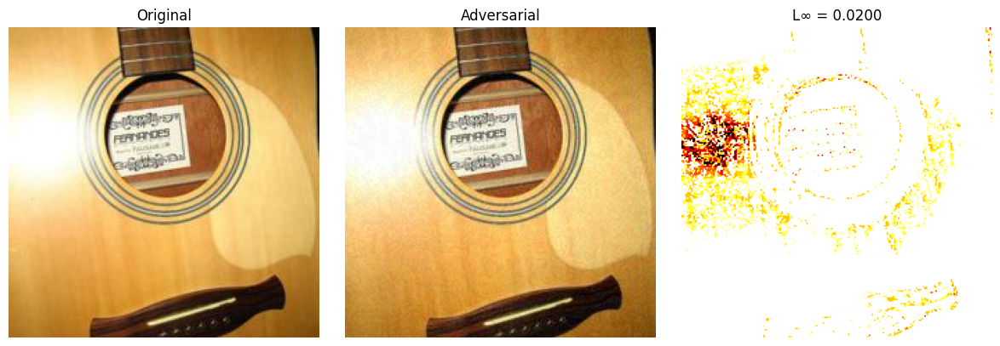

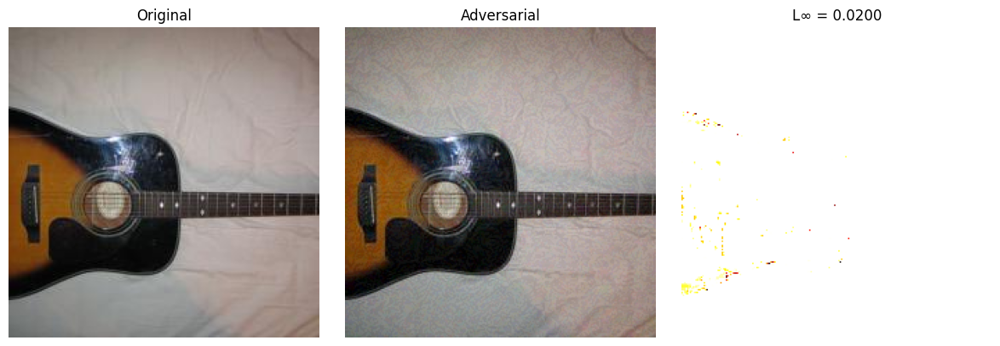

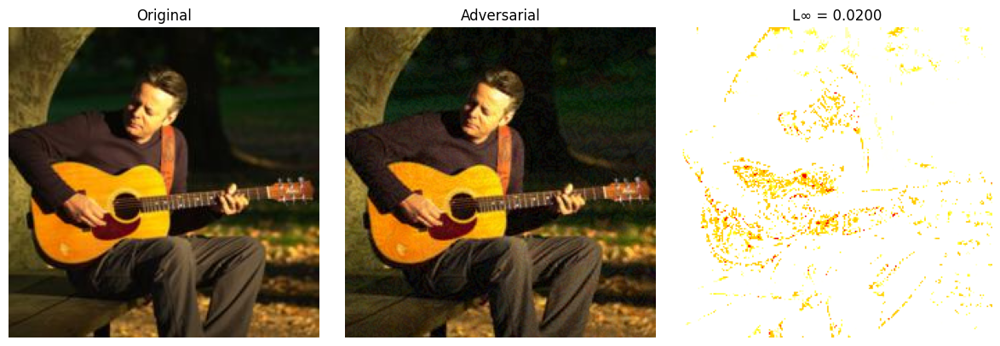

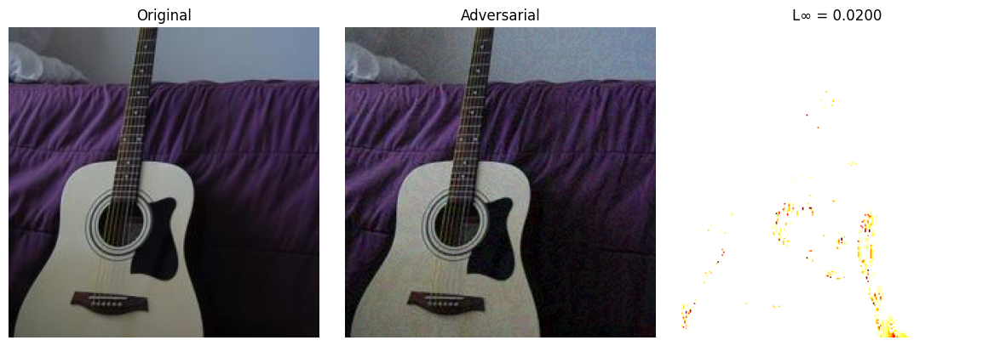

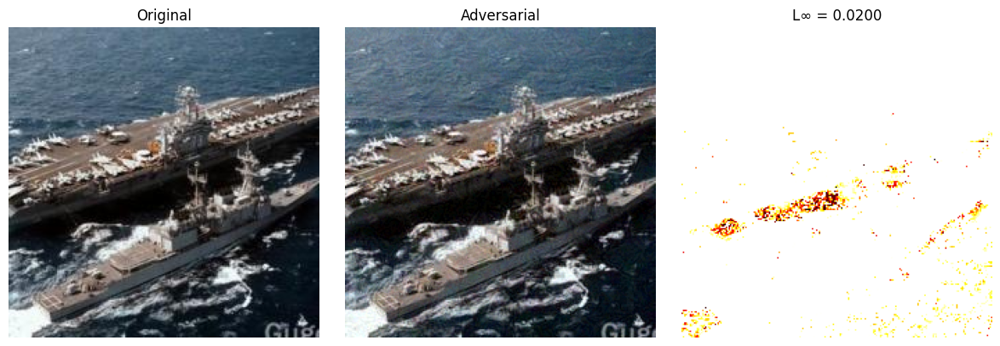

In [16]:
# ----------- Report Accuracy ------------
print(f"\n[FGSM ε={epsilon}]")
print(f"Top-1 Accuracy: {top1_correct / total:.4f}")
print(f"Top-5 Accuracy: {top5_correct / total:.4f}")

# ----------- Save Adversarial Test Set ------------
adv_tensor = torch.cat(adv_images)
label_tensor = torch.cat(adv_labels)
torch.save((adv_tensor, label_tensor), os.path.join(save_dir, "adv_test_set_1.pt"))

# ----------- Visualize Examples ------------
for i, (orig, pert, lbl) in enumerate(success_examples):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    # 原图
    axs[0].imshow(np.transpose(orig.squeeze().numpy(), (1, 2, 0)))
    axs[0].set_title("Original")
    axs[0].axis('off')

    # 对抗图
    axs[1].imshow(np.transpose(pert.squeeze().numpy(), (1, 2, 0)))
    axs[1].set_title("Adversarial")
    axs[1].axis('off')

    # 差异图（热力图风格）
    delta = (pert - orig).squeeze().numpy()
    diff_max = np.abs(delta).max()
    delta_display = np.abs(delta).transpose(1, 2, 0).mean(axis=-1)  # 灰度热力
    axs[2].imshow(delta_display, cmap='hot', vmin=0, vmax=0.02)
    axs[2].set_title(f"L∞ = {diff_max:.4f}")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()


Running MIM: 100%|██████████| 500/500 [00:59<00:00,  8.46it/s]



[MIM ε=0.02]
Top-1 Accuracy: 0.0000
Top-5 Accuracy: 0.0160


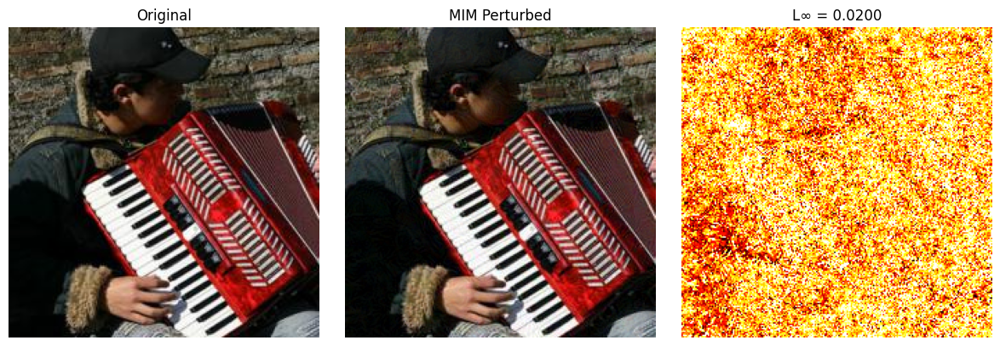

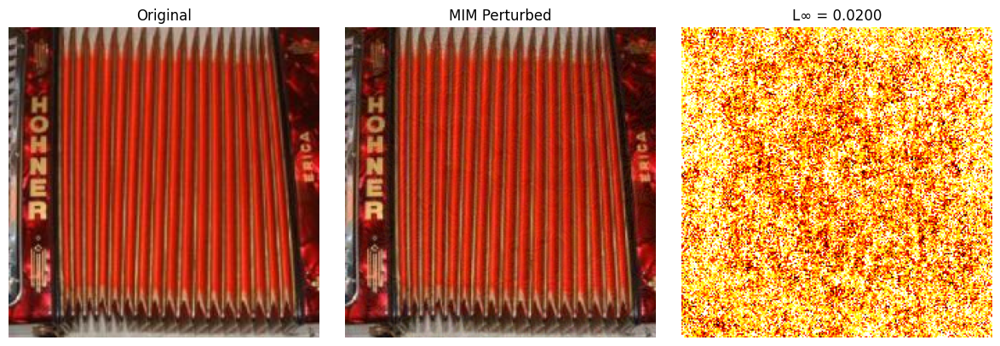

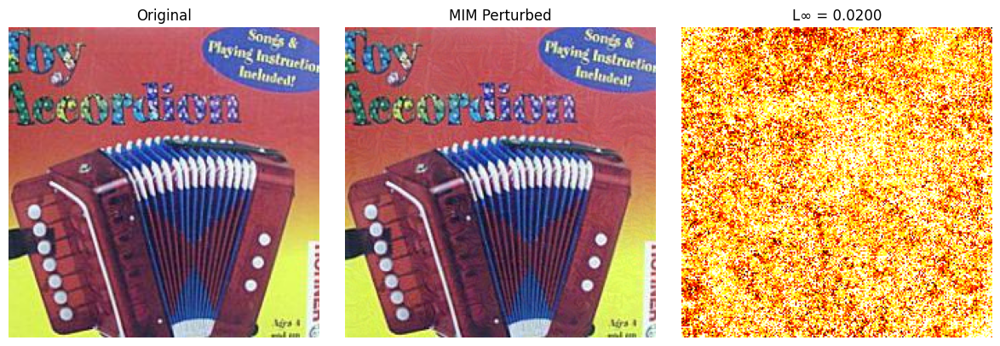

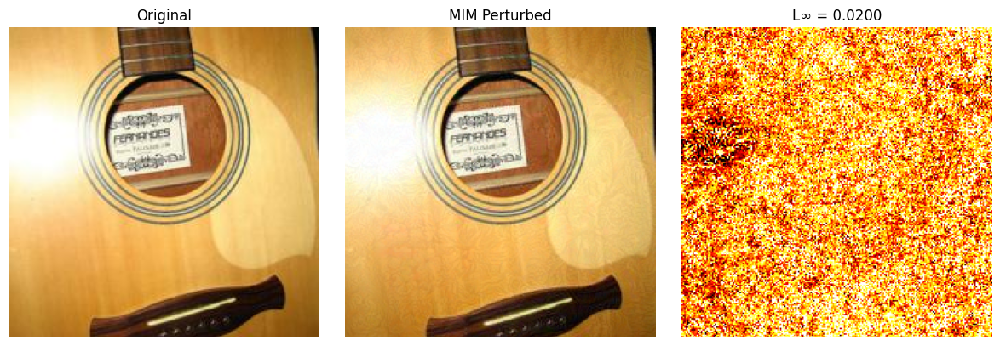

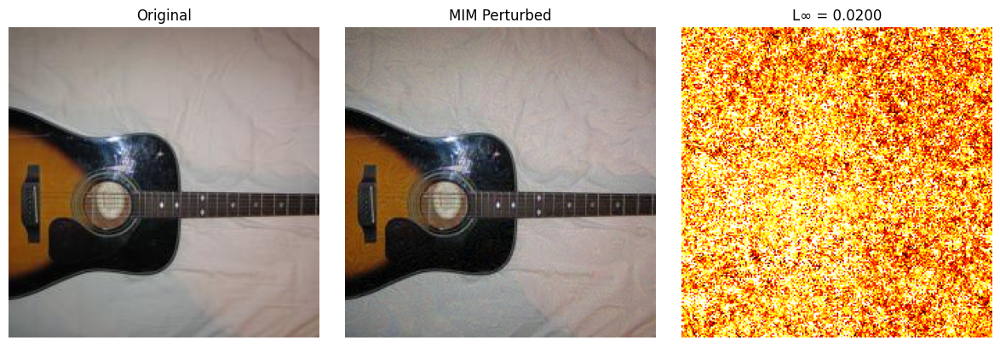

In [19]:
import torch
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import numpy as np
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
import json

# ----------- Config ------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epsilon = 0.02
alpha = 0.002  # step size
num_steps = 10
decay = 1.0    # momentum decay
save_dir = "./adv_test_set"
os.makedirs(save_dir, exist_ok=True)

# ----------- Normalization ------------
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
mean_torch = torch.tensor(mean, dtype=torch.float32).view(1, 3, 1, 1).to(device)
std_torch = torch.tensor(std, dtype=torch.float32).view(1, 3, 1, 1).to(device)

normalize = transforms.Normalize(mean.tolist(), std.tolist())
transform = transforms.Compose([transforms.ToTensor(), normalize])

# ----------- Dataset ------------
dataset = torchvision.datasets.ImageFolder(root="./TestDataSet", transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

with open("./TestDataSet/labels_list.json", "r") as f:
    label_list = json.load(f)
idx_map = {i: int(label.split(":")[0]) for i, label in enumerate(label_list)}

# ----------- Load Model ------------
model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
model.eval().to(device)

# ----------- MIM Attack ------------
def mim_attack(x_orig, y_true, epsilon, alpha, steps, decay):
    x_adv = x_orig.clone().detach()
    g = torch.zeros_like(x_orig).to(device)

    for _ in range(steps):
        x_adv = x_adv.detach().requires_grad_()
        logits = model((x_adv - mean_torch) / std_torch)
        loss = F.cross_entropy(logits, y_true)
        model.zero_grad()
        loss.backward()
        grad = x_adv.grad.detach()

        grad_norm = grad / grad.abs().mean(dim=(1, 2, 3), keepdim=True)
        g = decay * g + grad_norm
        x_adv = x_adv + alpha * g.sign()
        x_adv = torch.max(torch.min(x_adv, x_orig + epsilon), x_orig - epsilon)
        x_adv = torch.clamp(x_adv, 0, 1)

    return x_adv.detach()

# ----------- Run Attack & Evaluate ------------
adv_images, adv_labels, success_examples = [], [], []
top1_correct, top5_correct, total = 0, 0, 0

for img, label in tqdm(dataloader, desc="Running MIM"):
    img, label = img.to(device), label.to(device)
    y_true = torch.tensor([idx_map[label.item()]]).to(device)

    # Unnormalize image to [0, 1]
    x_orig = torch.clamp(img * std_torch + mean_torch, 0, 1)

    # Run MIM attack
    x_adv = mim_attack(x_orig, y_true, epsilon, alpha, num_steps, decay)

    # Evaluate model
    x_input = (x_adv - mean_torch) / std_torch
    with torch.no_grad():
        output = model(x_input)
    _, top5 = output.topk(5, 1, True, True)
    top1_correct += (top5[:, 0] == y_true).sum().item()
    top5_correct += (top5 == y_true.view(-1, 1)).sum().item()
    total += 1

    # Save attack sample
    adv_images.append(x_input.cpu())
    adv_labels.append(label.cpu())

    # Visualization samples
    with torch.no_grad():
        orig_output = model(img)
        if torch.argmax(orig_output) == y_true and torch.argmax(output) != y_true:
            if len(success_examples) < 5:
                success_examples.append((x_orig.cpu(), x_adv.cpu(), label.cpu()))

# ----------- Report Accuracy ------------
print(f"\n[MIM ε={epsilon}]")
print(f"Top-1 Accuracy: {top1_correct / total:.4f}")
print(f"Top-5 Accuracy: {top5_correct / total:.4f}")

# ----------- Save Dataset ------------
adv_tensor = torch.cat(adv_images)
label_tensor = torch.cat(adv_labels)
torch.save((adv_tensor, label_tensor), os.path.join(save_dir, "adv_test_set_2.pt"))

# ----------- Visualize Examples ------------
for i, (orig, pert, lbl) in enumerate(success_examples):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    axs[0].imshow(np.transpose(orig.squeeze().numpy(), (1, 2, 0)))
    axs[0].set_title("Original")
    axs[0].axis('off')

    axs[1].imshow(np.transpose(pert.squeeze().numpy(), (1, 2, 0)))
    axs[1].set_title("MIM Perturbed")
    axs[1].axis('off')

    delta = (pert - orig).squeeze().numpy()
    diff_max = np.abs(delta).max()
    delta_display = np.abs(delta).transpose(1, 2, 0).mean(axis=-1)
    axs[2].imshow(delta_display, cmap='hot', vmin=0, vmax=0.02)
    axs[2].set_title(f"L∞ = {diff_max:.4f}")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()


Running DI-FGSM: 100%|██████████| 500/500 [00:56<00:00,  8.79it/s]



[DI-FGSM ε=0.02]
Top-1 Accuracy: 0.0000
Top-5 Accuracy: 0.0440


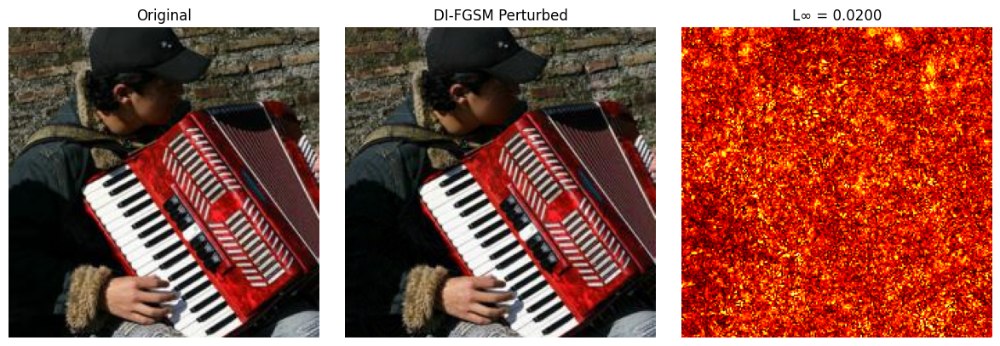

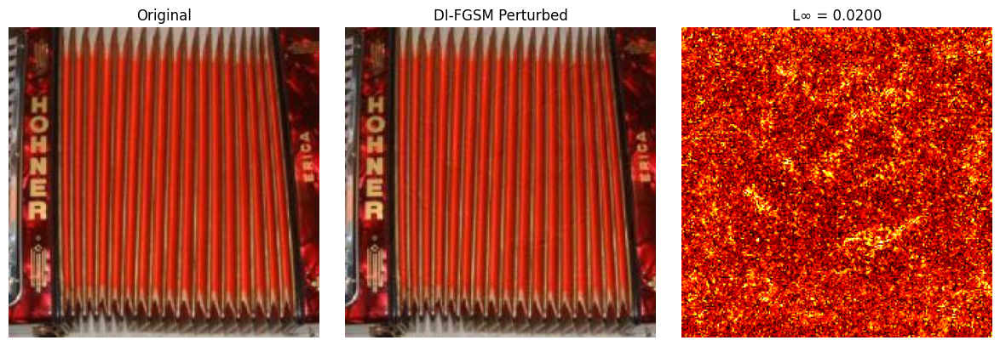

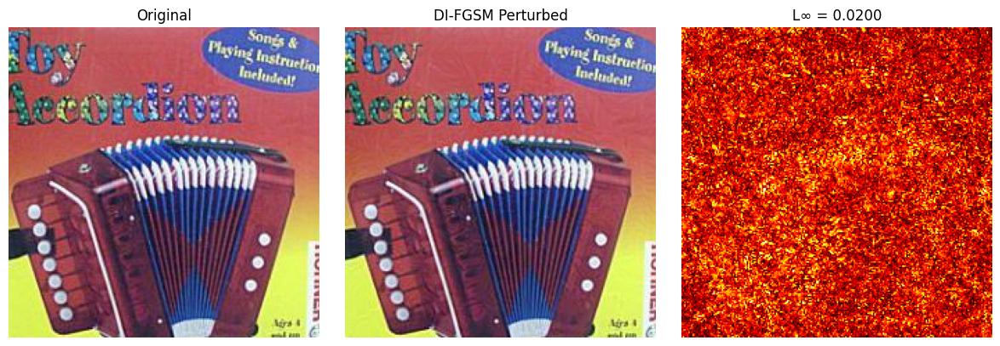

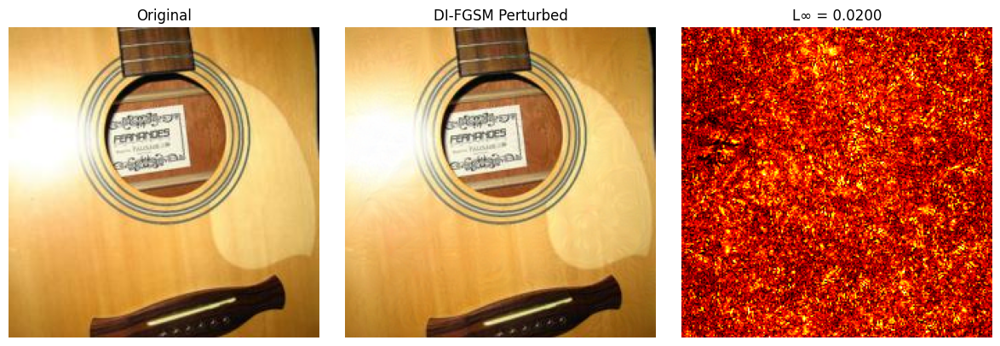

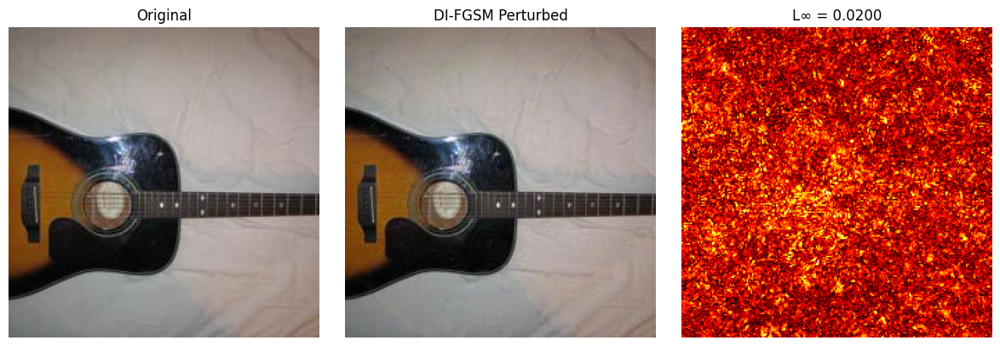

In [20]:
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import json
import random

# ----------- Config ------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epsilon = 0.02
alpha = 0.002
num_steps = 10
prob_diversity = 0.7  # 概率性施加 transform
resize_min, resize_max = 224, 256
save_dir = "./adv_test_set"
os.makedirs(save_dir, exist_ok=True)

# ----------- Normalization ------------
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
mean_torch = torch.tensor(mean, dtype=torch.float32).view(1, 3, 1, 1).to(device)
std_torch = torch.tensor(std, dtype=torch.float32).view(1, 3, 1, 1).to(device)

normalize = torchvision.transforms.Normalize(mean.tolist(), std.tolist())
transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    normalize
])

# ----------- Dataset ------------
dataset = torchvision.datasets.ImageFolder(root="./TestDataSet", transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

with open("./TestDataSet/labels_list.json", "r") as f:
    label_list = json.load(f)
idx_map = {i: int(label.split(":")[0]) for i, label in enumerate(label_list)}

# ----------- Load Model ------------
model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
model.eval().to(device)

# ----------- Random Resize & Pad Transform ------------
def input_diversity(x):
    if random.random() > prob_diversity:
        return x
    rnd = random.randint(resize_min, resize_max)
    x_resized = TF.resize(x, [rnd, rnd])
    pad_h = 256 - rnd
    pad_top = random.randint(0, pad_h)
    pad_bottom = pad_h - pad_top
    pad_w = 256 - rnd
    pad_left = random.randint(0, pad_w)
    pad_right = pad_w - pad_left
    x_padded = TF.pad(x_resized, [pad_left, pad_top, pad_right, pad_bottom], fill=0)
    x_final = TF.resize(x_padded, [224, 224])
    return x_final

# ----------- DI-FGSM Attack ------------
def di_fgsm(x_orig, y_true, eps, alpha, steps):
    x_adv = x_orig.clone().detach()
    for _ in range(steps):
        x_adv = x_adv.detach().requires_grad_()

        x_input = input_diversity(x_adv.squeeze(0)).unsqueeze(0)
        x_input = (x_input - mean_torch) / std_torch

        logits = model(x_input)
        loss = F.cross_entropy(logits, y_true)
        model.zero_grad()
        loss.backward()

        grad = x_adv.grad.detach()
        x_adv = x_adv + alpha * grad.sign()
        x_adv = torch.max(torch.min(x_adv, x_orig + eps), x_orig - eps)
        x_adv = torch.clamp(x_adv, 0, 1)

    return x_adv.detach()

# ----------- Run Attack & Evaluate ------------
adv_images, adv_labels, success_examples = [], [], []
top1_correct, top5_correct, total = 0, 0, 0

for img, label in tqdm(dataloader, desc="Running DI-FGSM"):
    img, label = img.to(device), label.to(device)
    y_true = torch.tensor([idx_map[label.item()]]).to(device)

    x_orig = torch.clamp(img * std_torch + mean_torch, 0, 1)

    x_adv = di_fgsm(x_orig, y_true, epsilon, alpha, num_steps)

    x_input = (x_adv - mean_torch) / std_torch
    with torch.no_grad():
        output = model(x_input)
    _, top5 = output.topk(5, 1, True, True)
    top1_correct += (top5[:, 0] == y_true).sum().item()
    top5_correct += (top5 == y_true.view(-1, 1)).sum().item()
    total += 1

    adv_images.append(x_input.cpu())
    adv_labels.append(label.cpu())

    with torch.no_grad():
        orig_output = model(img)
        if torch.argmax(orig_output) == y_true and torch.argmax(output) != y_true:
            if len(success_examples) < 5:
                success_examples.append((x_orig.cpu(), x_adv.cpu(), label.cpu()))

# ----------- Report Accuracy ------------
print(f"\n[DI-FGSM ε={epsilon}]")
print(f"Top-1 Accuracy: {top1_correct / total:.4f}")
print(f"Top-5 Accuracy: {top5_correct / total:.4f}")

# ----------- Save Dataset ------------
torch.save((torch.cat(adv_images), torch.cat(adv_labels)), os.path.join(save_dir, "adv_test_set_3.pt"))

# ----------- Visualize Examples ------------
for i, (orig, pert, lbl) in enumerate(success_examples):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    axs[0].imshow(np.transpose(orig.squeeze().numpy(), (1, 2, 0)))
    axs[0].set_title("Original")
    axs[0].axis('off')

    axs[1].imshow(np.transpose(pert.squeeze().numpy(), (1, 2, 0)))
    axs[1].set_title("DI-FGSM Perturbed")
    axs[1].axis('off')

    delta = (pert - orig).squeeze().numpy()
    diff_max = np.abs(delta).max()
    delta_display = np.abs(delta).transpose(1, 2, 0).mean(axis=-1)
    axs[2].imshow(delta_display, cmap='hot', vmin=0, vmax=0.02)
    axs[2].set_title(f"L∞ = {diff_max:.4f}")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()

Running T-FGSM: 100%|██████████| 500/500 [00:09<00:00, 52.01it/s]



[T-FGSM ε=0.02]
Top-1 Accuracy: 0.0900
Top-5 Accuracy: 0.2320


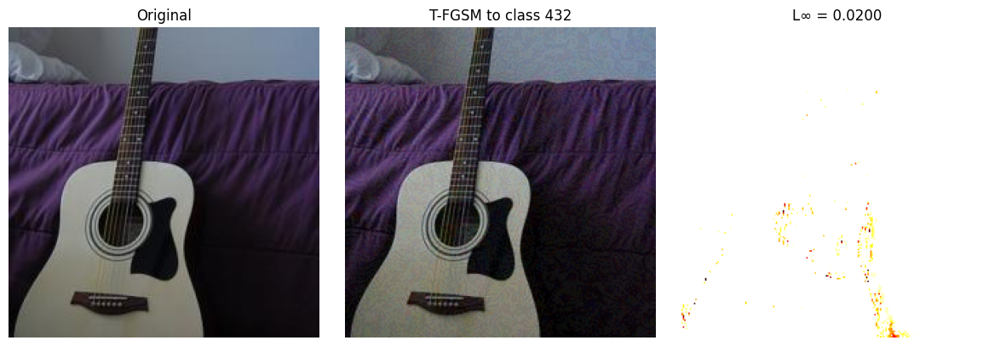

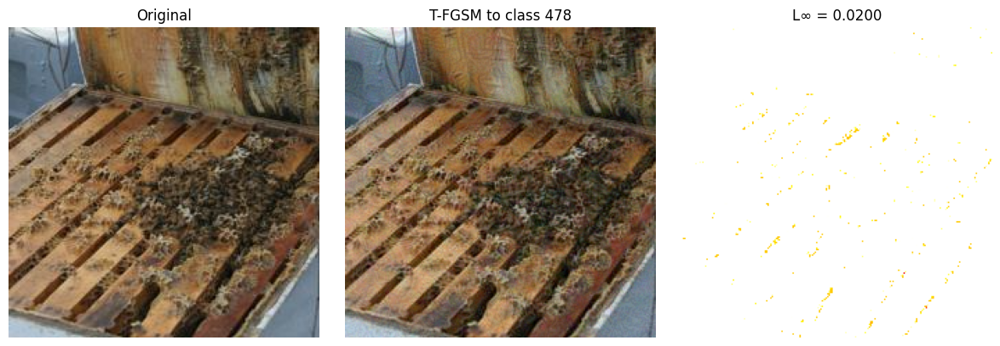

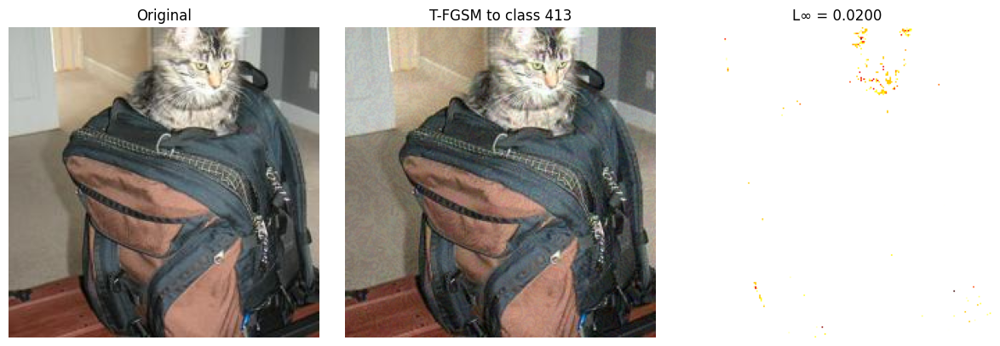

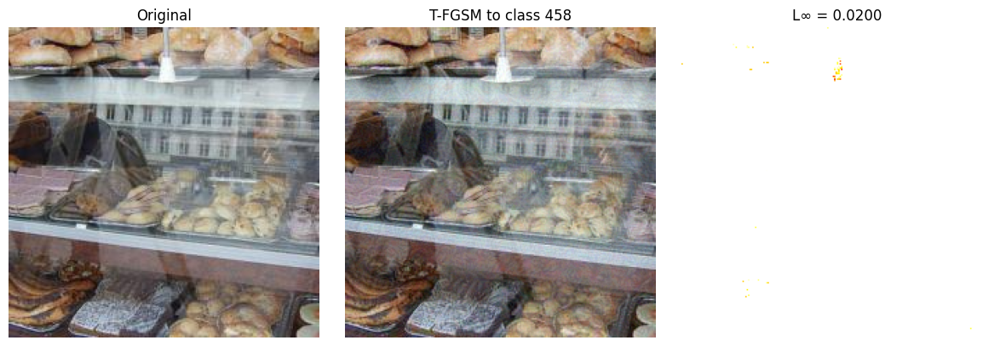

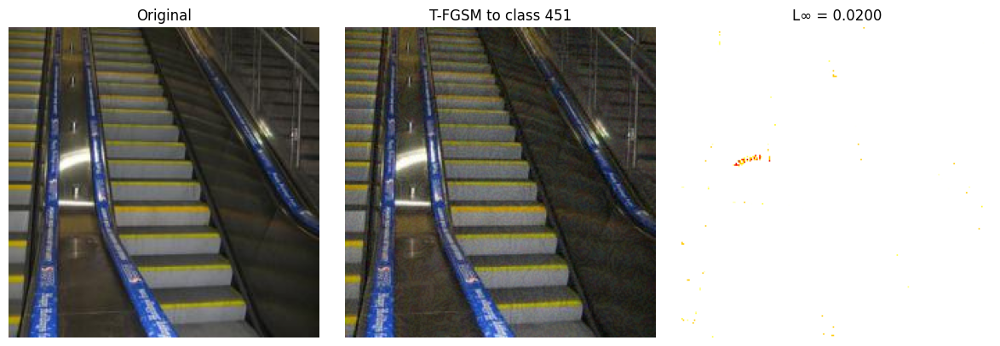

In [21]:
import torch
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import json
import random

# ----------- Config ------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epsilon = 0.02
save_dir = "./adv_test_set"
os.makedirs(save_dir, exist_ok=True)

# ----------- Normalization ------------
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
mean_torch = torch.tensor(mean, dtype=torch.float32).view(1, 3, 1, 1).to(device)
std_torch = torch.tensor(std, dtype=torch.float32).view(1, 3, 1, 1).to(device)

normalize = transforms.Normalize(mean.tolist(), std.tolist())
transform = transforms.Compose([transforms.ToTensor(), normalize])

# ----------- Dataset ------------
dataset = torchvision.datasets.ImageFolder(root="./TestDataSet", transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

with open("TestDataSet/labels_list.json", "r") as f:
    label_list = json.load(f)
idx_map = {i: int(label.split(":")[0]) for i, label in enumerate(label_list)}
label_indices = list(idx_map.values())

# ----------- Load Model ------------
model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
model.eval().to(device)

# ----------- T-FGSM Function ------------
def tfgsm_attack(x_orig, y_target, epsilon):
    x_adv = x_orig.clone().detach().requires_grad_()
    x_input = (x_adv - mean_torch) / std_torch
    output = model(x_input)
    loss = F.cross_entropy(output, y_target)
    model.zero_grad()
    loss.backward()
    grad = x_adv.grad.detach()
    x_adv = x_adv - epsilon * grad.sign()
    x_adv = torch.clamp(x_adv, 0, 1)
    return x_adv.detach()

# ----------- Attack Loop ------------
adv_images, adv_labels, success_examples = [], [], []
top1_correct, top5_correct, total = 0, 0, 0

for img, label in tqdm(dataloader, desc="Running T-FGSM"):
    img, label = img.to(device), label.to(device)
    y_true = torch.tensor([idx_map[label.item()]]).to(device)

    # Pick a random *incorrect* target class
    possible_targets = list(set(label_indices) - {y_true.item()})
    y_target = torch.tensor([random.choice(possible_targets)]).to(device)

    # Unnormalize image
    x_orig = torch.clamp(img * std_torch + mean_torch, 0, 1)

    # Run T-FGSM attack
    x_adv = tfgsm_attack(x_orig, y_target, epsilon)

    # Evaluate
    x_input = (x_adv - mean_torch) / std_torch
    with torch.no_grad():
        output = model(x_input)
    _, top5 = output.topk(5, 1, True, True)
    top1_correct += (top5[:, 0] == y_true).sum().item()
    top5_correct += (top5 == y_true.view(-1, 1)).sum().item()
    total += 1

    adv_images.append(x_input.cpu())
    adv_labels.append(label.cpu())

    # Save successful example
    with torch.no_grad():
        orig_output = model(img)
        if torch.argmax(orig_output) == y_true and torch.argmax(output) == y_target:
            if len(success_examples) < 5:
                success_examples.append((x_orig.cpu(), x_adv.cpu(), label.cpu(), y_target.cpu()))

# ----------- Report Accuracy ------------
print(f"\n[T-FGSM ε={epsilon}]")
print(f"Top-1 Accuracy: {top1_correct / total:.4f}")
print(f"Top-5 Accuracy: {top5_correct / total:.4f}")

# ----------- Save Dataset ------------
torch.save((torch.cat(adv_images), torch.cat(adv_labels)), os.path.join(save_dir, "adv_test_set_4.pt"))

# ----------- Visualize Examples ------------
for i, (orig, pert, lbl, y_tgt) in enumerate(success_examples):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    axs[0].imshow(np.transpose(orig.squeeze().numpy(), (1, 2, 0)))
    axs[0].set_title("Original")
    axs[0].axis('off')

    axs[1].imshow(np.transpose(pert.squeeze().numpy(), (1, 2, 0)))
    axs[1].set_title(f"T-FGSM to class {y_tgt.item()}")
    axs[1].axis('off')

    delta = (pert - orig).squeeze().numpy()
    diff_max = np.abs(delta).max()
    delta_display = np.abs(delta).transpose(1, 2, 0).mean(axis=-1)
    axs[2].imshow(delta_display, cmap='hot', vmin=0, vmax=0.02)
    axs[2].set_title(f"L∞ = {diff_max:.4f}")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()
